<p Style="text-align: center;color:green"> 30/04/2024 </p>

<h1 Style="text-align: center;color:red">Popularidad de Canciones</h1>
<h2 Style="text-align: center;color:blue">Universidad Castro Carazo</h2>

## Juan Andrés Brenes Benavides
### Cédula:401810764

<h3 Style="color:brown">Importar las librerias del proyecto</h3>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer


#### Se desactiva la generación de estas advertencias

In [2]:
pd.options.mode.chained_assignment = None

<h3 Style="color:brown">Cargar los set de datos en memoria</h3>

In [3]:
df=pd.read_csv("song_data.csv")
df.shape

(18835, 15)

In [4]:
df.head(5)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,Boulevard of Broken Dreams,73,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474
1,In The End,66,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370
2,Seven Nation Army,76,231733,0.008170,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.324
3,By The Way,74,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.198
4,How You Remind Me,56,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.574


#### Creación de informe de perfil 

In [5]:
profile=ProfileReport(df,title="Fast_EDA")

In [6]:
profile.to_file("Proyect.html")

C:\Users\juand\anaconda3\Lib\site-packages\ydata_profiling\profile_report.py:354: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
profile.to_notebook_iframe()

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_name         18835 non-null  object 
 1   song_popularity   18835 non-null  int64  
 2   song_duration_ms  18835 non-null  int64  
 3   acousticness      18835 non-null  float64
 4   danceability      18835 non-null  float64
 5   energy            18835 non-null  float64
 6   instrumentalness  18835 non-null  float64
 7   key               18835 non-null  int64  
 8   liveness          18835 non-null  float64
 9   loudness          18835 non-null  float64
 10  audio_mode        18835 non-null  int64  
 11  speechiness       18835 non-null  float64
 12  tempo             18835 non-null  float64
 13  time_signature    18835 non-null  int64  
 14  audio_valence     18835 non-null  float64
dtypes: float64(9), int64(5), object(1)
memory usage: 2.2+ MB


In [9]:
df.columns

Index(['song_name', 'song_popularity', 'song_duration_ms', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature',
       'audio_valence'],
      dtype='object')

#### Cambiar variables a tipo float

In [10]:
df[["acousticness", "danceability", "song_popularity", "song_duration_ms"]] = df[["acousticness", "danceability", "song_popularity", "song_duration_ms"]].astype("float")

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_name         18835 non-null  object 
 1   song_popularity   18835 non-null  float64
 2   song_duration_ms  18835 non-null  float64
 3   acousticness      18835 non-null  float64
 4   danceability      18835 non-null  float64
 5   energy            18835 non-null  float64
 6   instrumentalness  18835 non-null  float64
 7   key               18835 non-null  int64  
 8   liveness          18835 non-null  float64
 9   loudness          18835 non-null  float64
 10  audio_mode        18835 non-null  int64  
 11  speechiness       18835 non-null  float64
 12  tempo             18835 non-null  float64
 13  time_signature    18835 non-null  int64  
 14  audio_valence     18835 non-null  float64
dtypes: float64(11), int64(3), object(1)
memory usage: 2.2+ MB


#### Guarda el DataFrame df en un archivo Excel con el nombre "Proyect.xlsx"

In [12]:
df.to_excel("Proyect.xlsx")

<h3 Style="color:brown">Análisis de Valores Atípicos</h3>

In [13]:
dfDD=df.groupby(['song_popularity']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
song_popularity,,,,,,,,,,,,,,
0.0,272,272,272,272,272,272,272,272,272,272,272,272,272,272
1.0,111,111,111,111,111,111,111,111,111,111,111,111,111,111
2.0,103,103,103,103,103,103,103,103,103,103,103,103,103,103
3.0,72,72,72,72,72,72,72,72,72,72,72,72,72,72
4.0,91,91,91,91,91,91,91,91,91,91,91,91,91,91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95.0,61,61,61,61,61,61,61,61,61,61,61,61,61,61
96.0,53,53,53,53,53,53,53,53,53,53,53,53,53,53
97.0,36,36,36,36,36,36,36,36,36,36,36,36,36,36


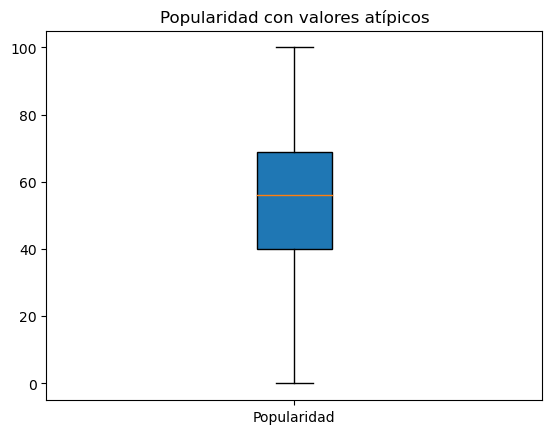

In [14]:
plt.boxplot(df["song_popularity"],  patch_artist=True, labels=["Popularidad"])
plt.title('Popularidad con valores atípicos')
plt.show()

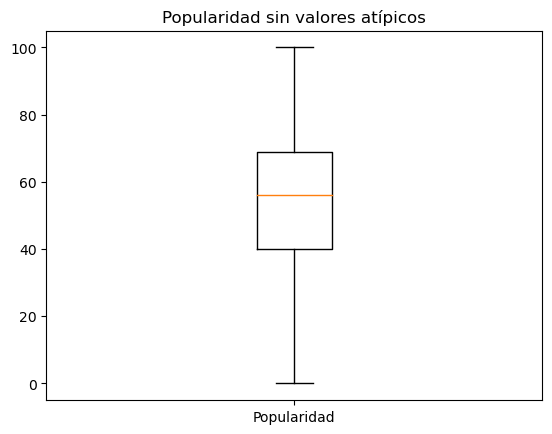

In [15]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["song_popularity"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_sp = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Popularidad sin valores atípicos')
ax.boxplot(x_sp, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Popularidad"])

# Show plot
plt.show()

In [16]:
dfDD=df.groupby(['song_duration_ms']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
song_duration_ms,,,,,,,,,,,,,,
12000.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
26186.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
31373.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
35920.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
50014.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92250.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
92333.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
92508.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


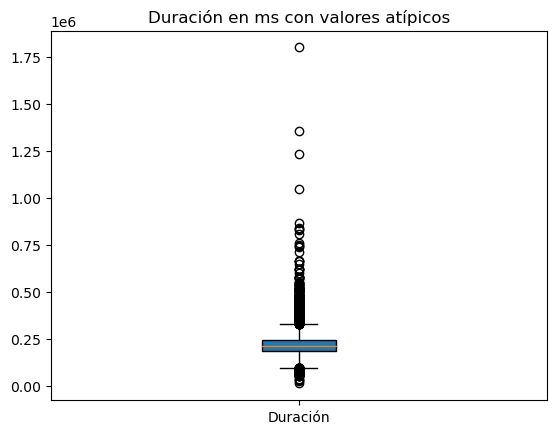

In [17]:
plt.boxplot(df["song_duration_ms"],  patch_artist=True, labels=["Duración"])
plt.title('Duración en ms con valores atípicos')
plt.show()

In [18]:
print (df["song_duration_ms"])

0        262333.0
1        216933.0
2        231733.0
3        216933.0
4        223826.0
           ...   
18830    159645.0
18831    205666.0
18832    182211.0
18833    352280.0
18834    193533.0
Name: song_duration_ms, Length: 18835, dtype: float64


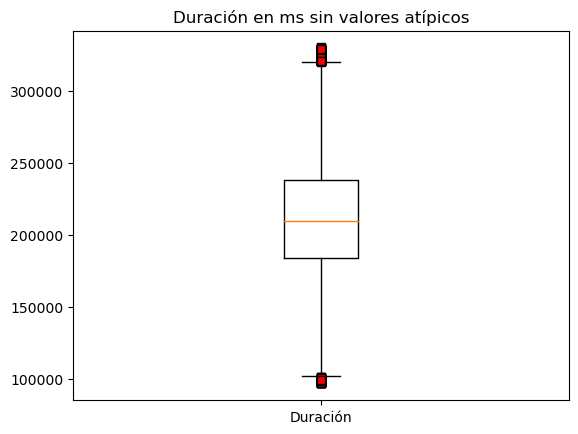

In [19]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["song_duration_ms"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_sms = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Duración en ms sin valores atípicos')
ax.boxplot(x_sms, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Duración"])

# Show plot
plt.show()

In [20]:
dfDD=df.groupby(['acousticness']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
acousticness,,,,,,,,,,,,,,
0.000001,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000001,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000001,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000001,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000002,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.000019,2,2,2,2,2,2,2,2,2,2,2,2,2,2
0.000020,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.000020,1,1,1,1,1,1,1,1,1,1,1,1,1,1


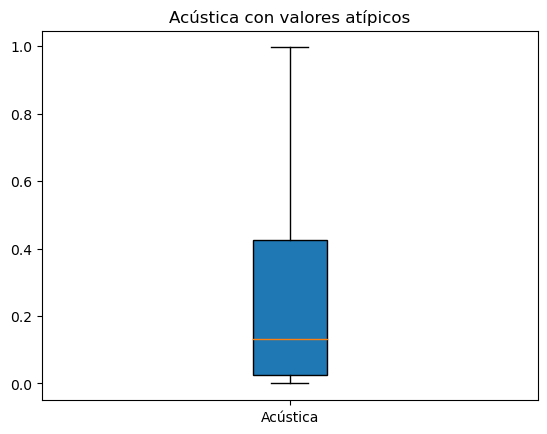

In [21]:
plt.boxplot(df["acousticness"],  patch_artist=True, labels=["Acústica"])
plt.title('Acústica con valores atípicos')
plt.show()

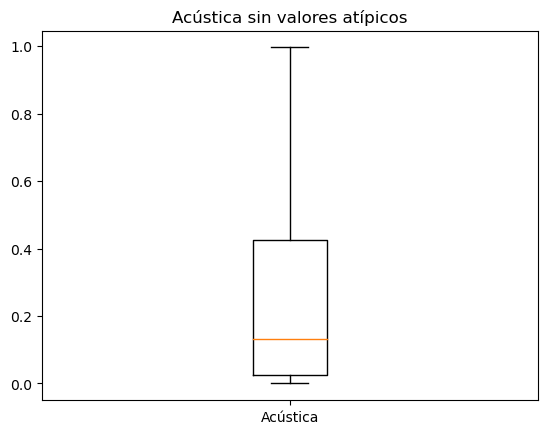

In [22]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["acousticness"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_acous = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Acústica sin valores atípicos')
ax.boxplot(x_acous, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Acústica"])

# Show plot
plt.show()

In [23]:
dfDD=df.groupby(['danceability']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
danceability,,,,,,,,,,,,,,
0.0000,2,2,2,2,2,2,2,2,2,2,2,2,2,2
0.0594,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0617,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0625,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0660,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.2220,2,2,2,2,2,2,2,2,2,2,2,2,2,2
0.2230,4,4,4,4,4,4,4,4,4,4,4,4,4,4
0.2240,1,1,1,1,1,1,1,1,1,1,1,1,1,1


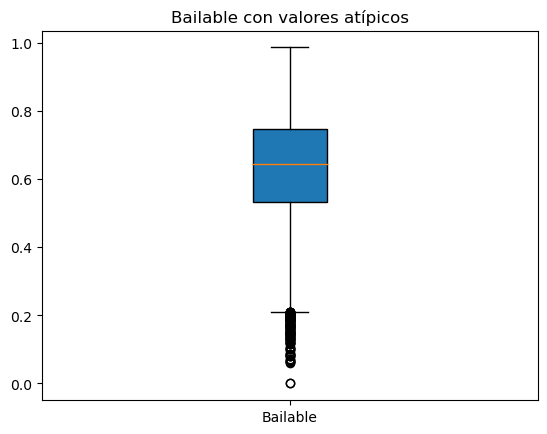

In [24]:
plt.boxplot(df["danceability"],  patch_artist=True, labels=["Bailable"])
plt.title('Bailable con valores atípicos')
plt.show()

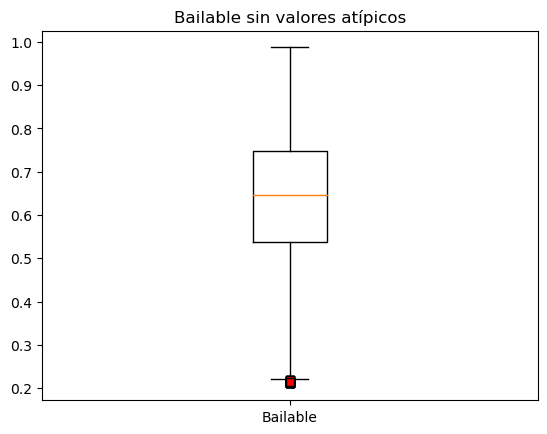

In [25]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["danceability"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_dan = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Bailable sin valores atípicos')
ax.boxplot(x_dan, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Bailable"])

# Show plot
plt.show()


In [26]:
dfDD=df.groupby(['energy']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
energy,,,,,,,,,,,,,,
0.00107,2,2,2,2,2,2,2,2,2,2,2,2,2,2
0.00163,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.00205,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.00212,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.00264,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.03250,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.03300,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.03310,3,3,3,3,3,3,3,3,3,3,3,3,3,3


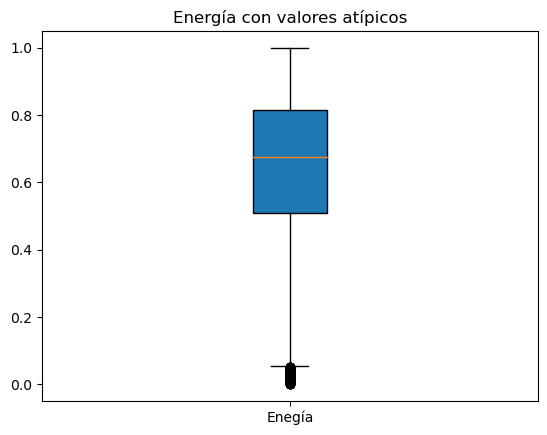

In [27]:
plt.boxplot(df["energy"],  patch_artist=True, labels=["Enegía"])
plt.title('Energía con valores atípicos')
plt.show()

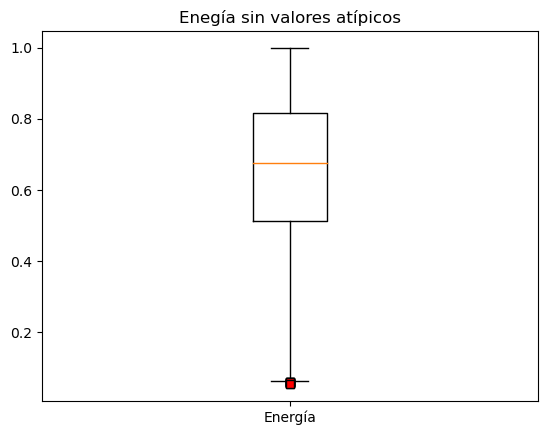

In [28]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["energy"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_ene = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Enegía sin valores atípicos')
ax.boxplot(x_ene, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Energía"])

# Show plot
plt.show()

In [29]:
dfDD=df.groupby(['instrumentalness']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
instrumentalness,,,,,,,,,,,,,,
0.000000,7150,7150,7150,7150,7150,7150,7150,7150,7150,7150,7150,7150,7150,7150
0.000001,2,2,2,2,2,2,2,2,2,2,2,2,2,2
0.000001,6,6,6,6,6,6,6,6,6,6,6,6,6,6
0.000001,8,8,8,8,8,8,8,8,8,8,8,8,8,8
0.000001,8,8,8,8,8,8,8,8,8,8,8,8,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.000002,7,7,7,7,7,7,7,7,7,7,7,7,7,7
0.000002,2,2,2,2,2,2,2,2,2,2,2,2,2,2
0.000002,7,7,7,7,7,7,7,7,7,7,7,7,7,7


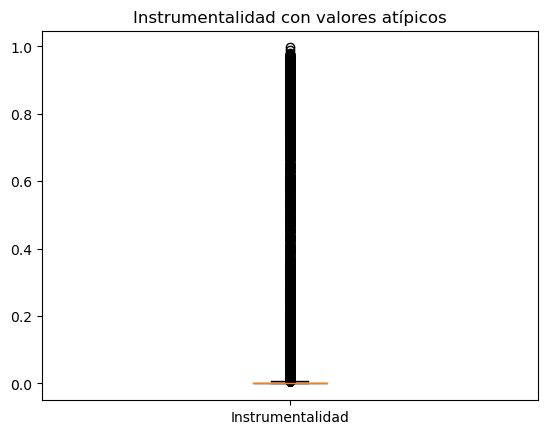

In [30]:
plt.boxplot(df["instrumentalness"],  patch_artist=True, labels=["Instrumentalidad"])
plt.title('Instrumentalidad con valores atípicos')
plt.show()

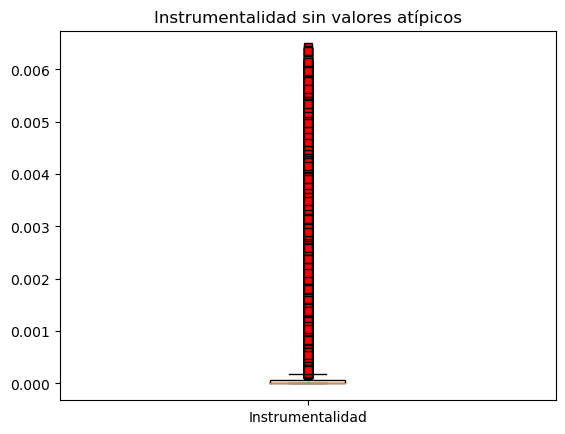

In [31]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["instrumentalness"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_inst = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Instrumentalidad sin valores atípicos')
ax.boxplot(x_inst, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Instrumentalidad"])

# Show plot
plt.show()

In [32]:
dfDD=df.groupby(['key']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
key,,,,,,,,,,,,,,
0,2182,2182,2182,2182,2182,2182,2182,2182,2182,2182,2182,2182,2182,2182
1,2164,2164,2164,2164,2164,2164,2164,2164,2164,2164,2164,2164,2164,2164
2,1715,1715,1715,1715,1715,1715,1715,1715,1715,1715,1715,1715,1715,1715
3,512,512,512,512,512,512,512,512,512,512,512,512,512,512
4,1327,1327,1327,1327,1327,1327,1327,1327,1327,1327,1327,1327,1327,1327
5,1574,1574,1574,1574,1574,1574,1574,1574,1574,1574,1574,1574,1574,1574
6,1351,1351,1351,1351,1351,1351,1351,1351,1351,1351,1351,1351,1351,1351
7,2032,2032,2032,2032,2032,2032,2032,2032,2032,2032,2032,2032,2032,2032
8,1349,1349,1349,1349,1349,1349,1349,1349,1349,1349,1349,1349,1349,1349


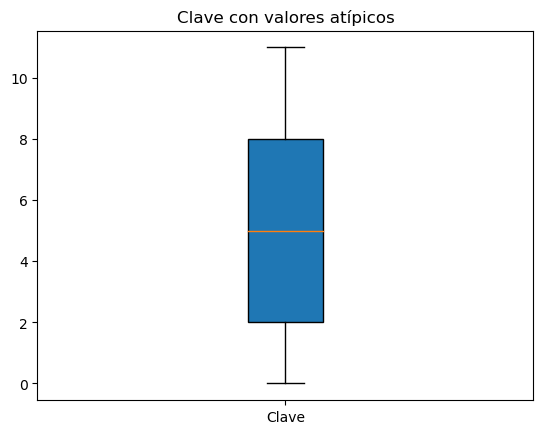

In [33]:
plt.boxplot(df["key"],  patch_artist=True, labels=["Clave"])
plt.title('Clave con valores atípicos')
plt.show()

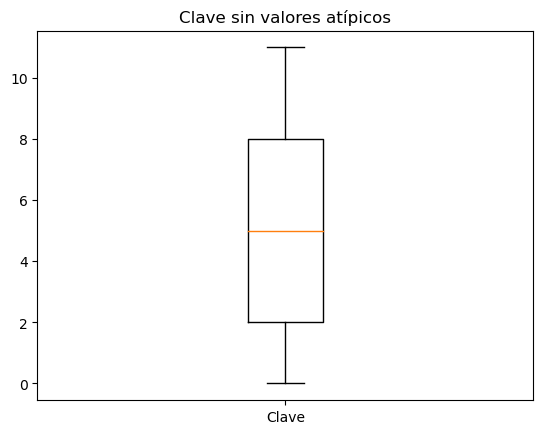

In [34]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["key"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_key = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Clave sin valores atípicos')
ax.boxplot(x_key, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Clave"])

# Show plot
plt.show()

In [35]:
dfDD=df.groupby(['liveness']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
liveness,,,,,,,,,,,,,,
0.0109,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0119,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0148,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0157,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0186,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.0386,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0387,3,3,3,3,3,3,3,3,3,3,3,3,3,3
0.0388,4,4,4,4,4,4,4,4,4,4,4,4,4,4


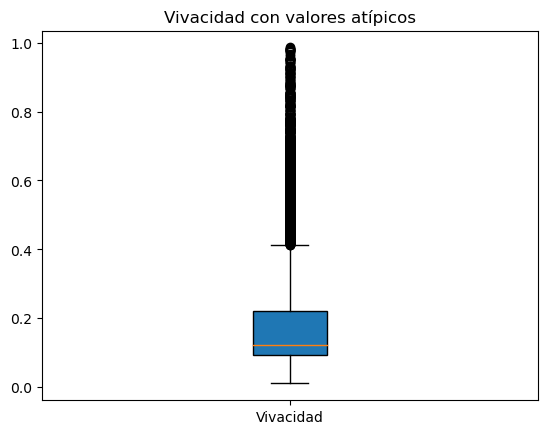

In [36]:
plt.boxplot(df["liveness"],  patch_artist=True, labels=["Vivacidad"])
plt.title('Vivacidad con valores atípicos')
plt.show()

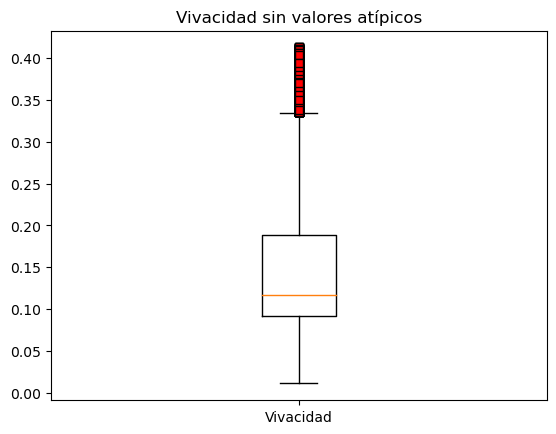

In [37]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["liveness"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_liv = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Vivacidad sin valores atípicos')
ax.boxplot(x_liv, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Vivacidad"])

# Show plot
plt.show()

In [38]:
dfDD=df.groupby(['loudness']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,audio_mode,speechiness,tempo,time_signature,audio_valence
loudness,,,,,,,,,,,,,,
-38.768,1,1,1,1,1,1,1,1,1,1,1,1,1,1
-36.729,1,1,1,1,1,1,1,1,1,1,1,1,1,1
-36.281,1,1,1,1,1,1,1,1,1,1,1,1,1,1
-35.449,1,1,1,1,1,1,1,1,1,1,1,1,1,1
-35.389,2,2,2,2,2,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
-24.706,1,1,1,1,1,1,1,1,1,1,1,1,1,1
-24.693,1,1,1,1,1,1,1,1,1,1,1,1,1,1
-24.656,1,1,1,1,1,1,1,1,1,1,1,1,1,1


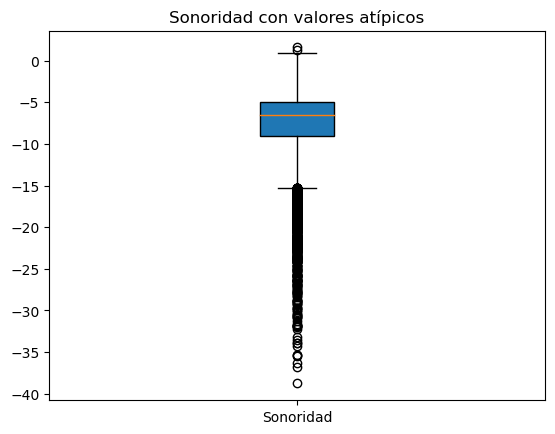

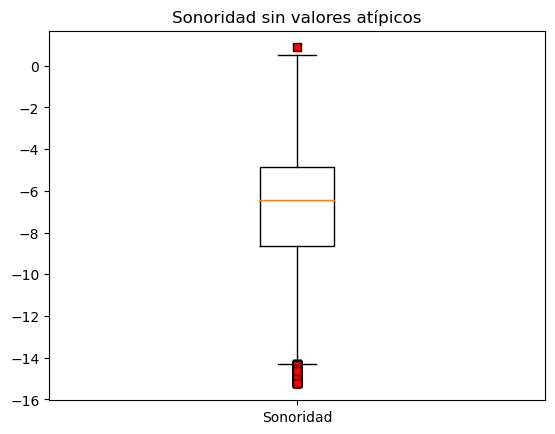

In [39]:
plt.boxplot(df["loudness"],  patch_artist=True, labels=["Sonoridad"])
plt.title('Sonoridad con valores atípicos')
plt.show()

# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["loudness"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_loud = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Sonoridad sin valores atípicos')
ax.boxplot(x_loud, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Sonoridad"])

# Show plot
plt.show()

In [40]:
dfDD=df.groupby(['audio_mode']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,speechiness,tempo,time_signature,audio_valence
audio_mode,,,,,,,,,,,,,,
0,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004,7004
1,11831,11831,11831,11831,11831,11831,11831,11831,11831,11831,11831,11831,11831,11831


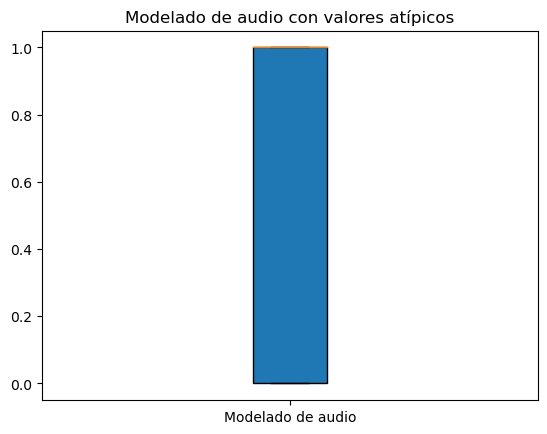

In [41]:
plt.boxplot(df["audio_mode"],  patch_artist=True, labels=["Modelado de audio"])
plt.title('Modelado de audio con valores atípicos')
plt.show()

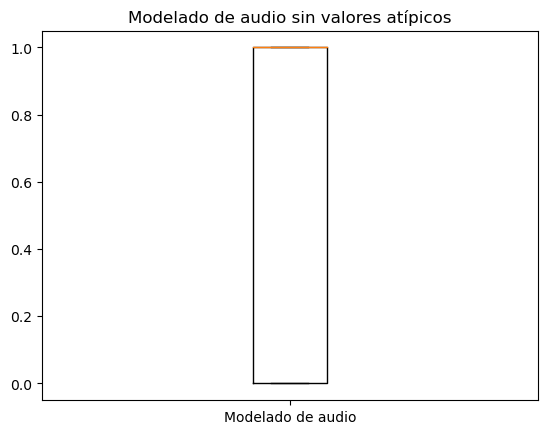

In [42]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["audio_mode"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_am= x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Modelado de audio sin valores atípicos')
ax.boxplot(x_am, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Modelado de audio"])

# Show plot
plt.show()

In [43]:
dfDD=df.groupby(['speechiness']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,tempo,time_signature,audio_valence
speechiness,,,,,,,,,,,,,,
0.0000,2,2,2,2,2,2,2,2,2,2,2,2,2,2
0.0224,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0228,4,4,4,4,4,4,4,4,4,4,4,4,4,4
0.0229,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0231,3,3,3,3,3,3,3,3,3,3,3,3,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.0324,54,54,54,54,54,54,54,54,54,54,54,54,54,54
0.0325,40,40,40,40,40,40,40,40,40,40,40,40,40,40
0.0326,39,39,39,39,39,39,39,39,39,39,39,39,39,39


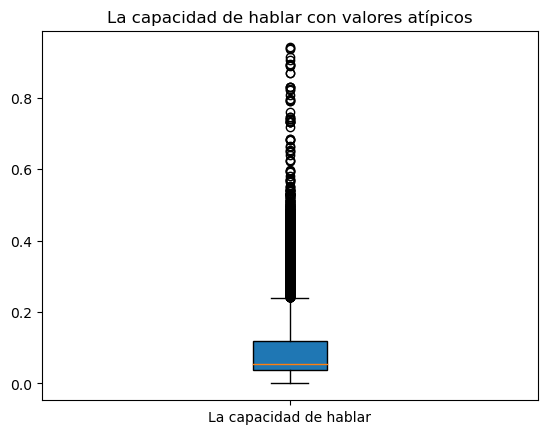

In [44]:
plt.boxplot(df["speechiness"],  patch_artist=True, labels=["La capacidad de hablar"])
plt.title('La capacidad de hablar con valores atípicos')
plt.show()

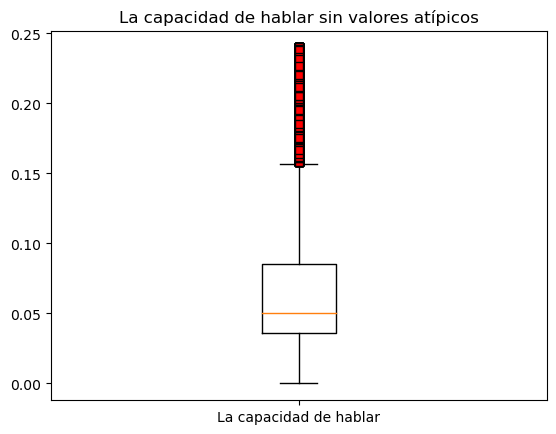

In [45]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["speechiness"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_spee = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('La capacidad de hablar sin valores atípicos')
ax.boxplot(x_spee, flierprops=dict(marker="s", markerfacecolor="red"),labels=["La capacidad de hablar"])

# Show plot
plt.show()

In [46]:
dfDD=df.groupby(['tempo']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,time_signature,audio_valence
tempo,,,,,,,,,,,,,,
0.000,2,2,2,2,2,2,2,2,2,2,2,2,2,2
46.591,1,1,1,1,1,1,1,1,1,1,1,1,1,1
47.953,1,1,1,1,1,1,1,1,1,1,1,1,1,1
51.607,1,1,1,1,1,1,1,1,1,1,1,1,1,1
52.181,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66.998,1,1,1,1,1,1,1,1,1,1,1,1,1,1
67.003,1,1,1,1,1,1,1,1,1,1,1,1,1,1
67.007,1,1,1,1,1,1,1,1,1,1,1,1,1,1


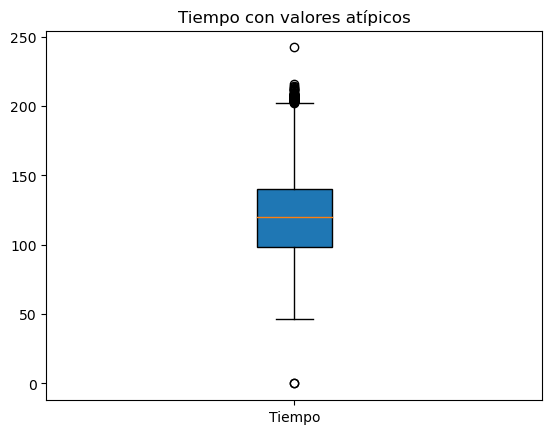

In [47]:
plt.boxplot(df["tempo"],  patch_artist=True, labels=["Tiempo"])
plt.title('Tiempo con valores atípicos')
plt.show()

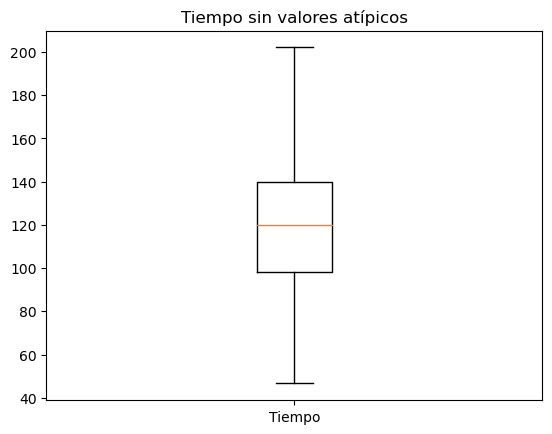

In [48]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["tempo"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_temp = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Tiempo sin valores atípicos')
ax.boxplot(x_temp, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Tiempo"])

# Show plot
plt.show()

In [49]:
dfDD=df.groupby(['time_signature']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,audio_valence
time_signature,,,,,,,,,,,,,,
0,3,3,3,3,3,3,3,3,3,3,3,3,3,3
1,73,73,73,73,73,73,73,73,73,73,73,73,73,73
3,772,772,772,772,772,772,772,772,772,772,772,772,772,772
4,17754,17754,17754,17754,17754,17754,17754,17754,17754,17754,17754,17754,17754,17754
5,233,233,233,233,233,233,233,233,233,233,233,233,233,233


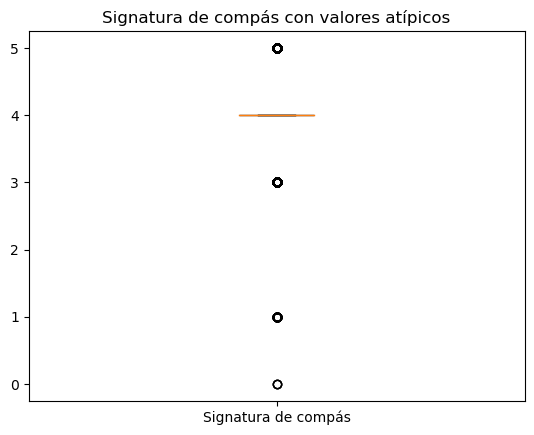

In [50]:
plt.boxplot(df["time_signature"],  patch_artist=True, labels=["Signatura de compás"])
plt.title('Signatura de compás con valores atípicos')
plt.show()

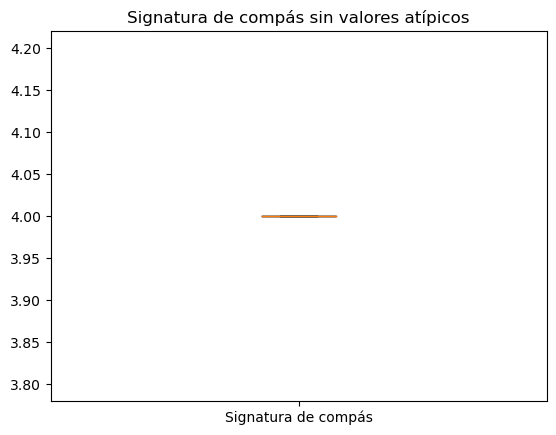

In [51]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["time_signature"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_ts = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Signatura de compás sin valores atípicos')
ax.boxplot(x_ts, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Signatura de compás"])

# Show plot
plt.show()

In [52]:
dfDD=df.groupby(['audio_valence']).count()
dfDD=dfDD.sort_index()
dfDD.head(100)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature
audio_valence,,,,,,,,,,,,,,
0.0000,2,2,2,2,2,2,2,2,2,2,2,2,2,2
0.0230,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0243,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0277,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0292,2,2,2,2,2,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0.0502,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0506,1,1,1,1,1,1,1,1,1,1,1,1,1,1
0.0509,2,2,2,2,2,2,2,2,2,2,2,2,2,2


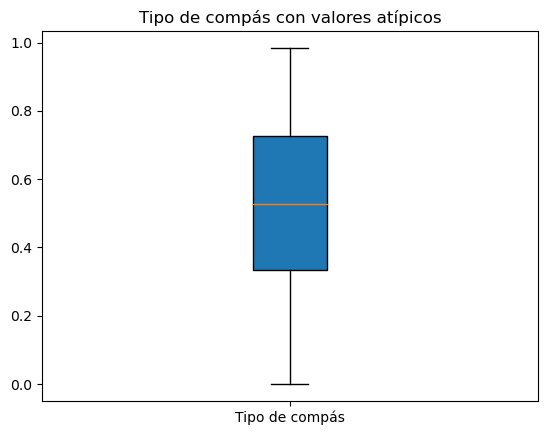

In [53]:
plt.boxplot(df["audio_valence"],  patch_artist=True, labels=["Tipo de compás"])
plt.title('Tipo de compás con valores atípicos')
plt.show()

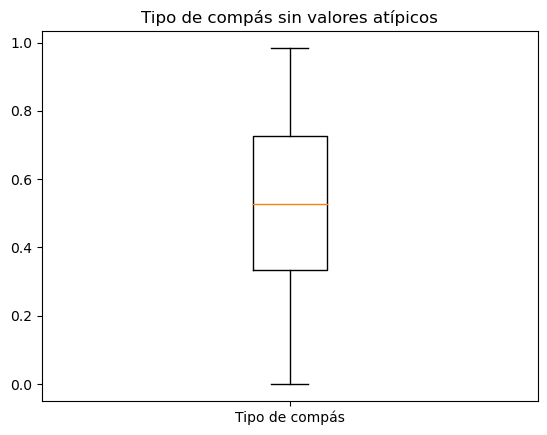

In [54]:
# Seed for reproducibility
np.random.seed(5)

# Data simulation
x = df["audio_valence"]

# Calculate whiskers limits
q1 = np.percentile(x, 25)
q3 = np.percentile(x, 75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Filter outliers
x_av = x[(x >= lower_whisker) & (x <= upper_whisker)]

# Box plot
fig, ax = plt.subplots()
plt.title('Tipo de compás sin valores atípicos')
ax.boxplot(x_av, flierprops=dict(marker="s", markerfacecolor="red"),labels=["Tipo de compás"])

# Show plot
plt.show()

#### Lista de series sin valores atípicos

In [55]:
series_sin_atipicos = [x_sp,x_sms, x_acous,x_dan,x_ene,x_inst,x_key,x_liv,x_loud,x_am,x_spee,x_temp,x_ts,x_av]

#### Concatenar las series en un DataFrame

In [56]:
df_sin_atipicos = pd.concat(series_sin_atipicos, axis=1)

#### Verificar la información 

In [57]:
print(df_sin_atipicos.info())


<class 'pandas.core.frame.DataFrame'>
Index: 18835 entries, 0 to 18834
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   song_popularity   18835 non-null  float64
 1   song_duration_ms  18011 non-null  float64
 2   acousticness      18835 non-null  float64
 3   danceability      18702 non-null  float64
 4   energy            18684 non-null  float64
 5   instrumentalness  14765 non-null  float64
 6   key               18835 non-null  int64  
 7   liveness          17630 non-null  float64
 8   loudness          18130 non-null  float64
 9   audio_mode        18835 non-null  int64  
 10  speechiness       16660 non-null  float64
 11  tempo             18754 non-null  float64
 12  time_signature    17754 non-null  float64
 13  audio_valence     18835 non-null  float64
dtypes: float64(12), int64(2)
memory usage: 2.2 MB
None


In [58]:
df_sin_atipicos.head(100)

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,73.0,262333.0,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4.0,0.474
1,66.0,216933.0,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4.0,0.370
2,76.0,231733.0,0.008170,0.737,0.463,NaN,0,0.2550,-7.828,1,0.0792,123.881,4.0,0.324
3,74.0,216933.0,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4.0,0.198
4,56.0,223826.0,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4.0,0.574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,75.0,202853.0,0.181000,0.831,0.713,0.000000,1,0.0572,-3.646,0,0.0940,132.109,4.0,0.690
96,45.0,198386.0,0.079700,0.825,0.481,0.000000,2,0.2390,-8.600,1,0.0396,121.046,4.0,0.761
97,53.0,224413.0,0.235000,0.682,0.751,0.000000,8,0.1100,-5.812,0,0.0675,129.937,4.0,0.708
98,38.0,218448.0,0.006940,0.799,0.616,0.002370,5,0.2830,-4.599,0,0.0415,127.023,4.0,0.697


In [59]:
df=df_sin_atipicos

#### Distribución de Popularidad de la Canción

In [60]:
#Esta extrayendo una columna
variable=df['song_popularity']

C:\Users\juand\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


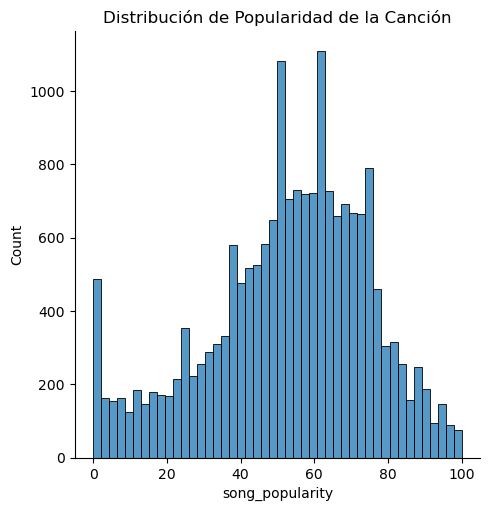

In [61]:
sns.displot(variable)
plt.title('Distribución de Popularidad de la Canción')
plt.show()

<h3 Style="color:brown">Relaciones entre cada característica y los variable "song_popularity"</h3>

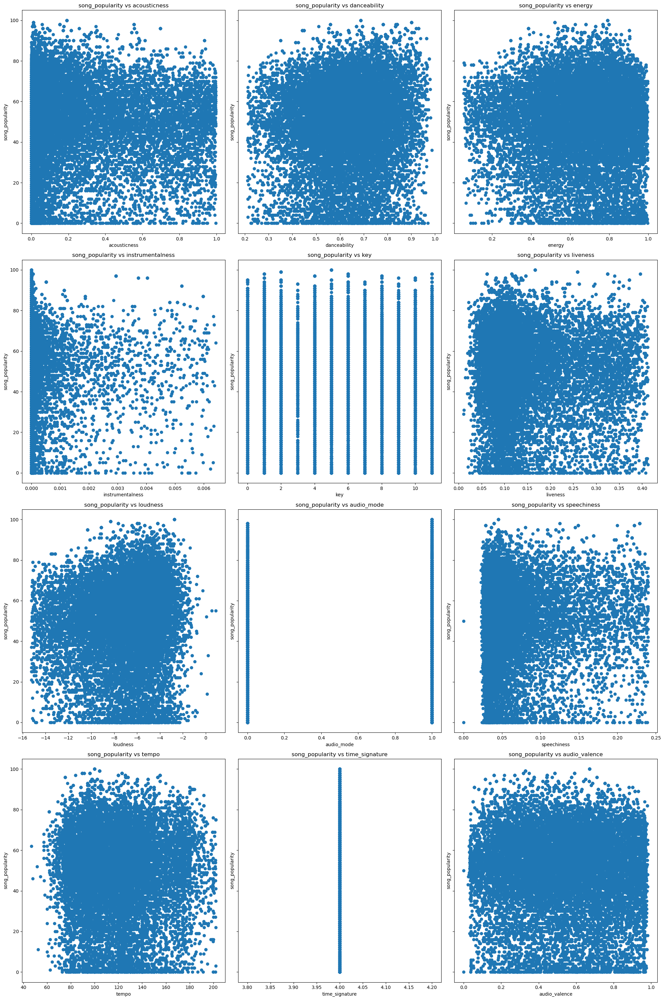

In [62]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,30), sharey=True)

for ax, column in zip(axes.flatten(), df.columns[2:17]):
    ax.scatter(df[column], df['song_popularity'], label=column, alpha=1)
    ax.set_title(f'song_popularity vs {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('song_popularity')

fig.tight_layout()

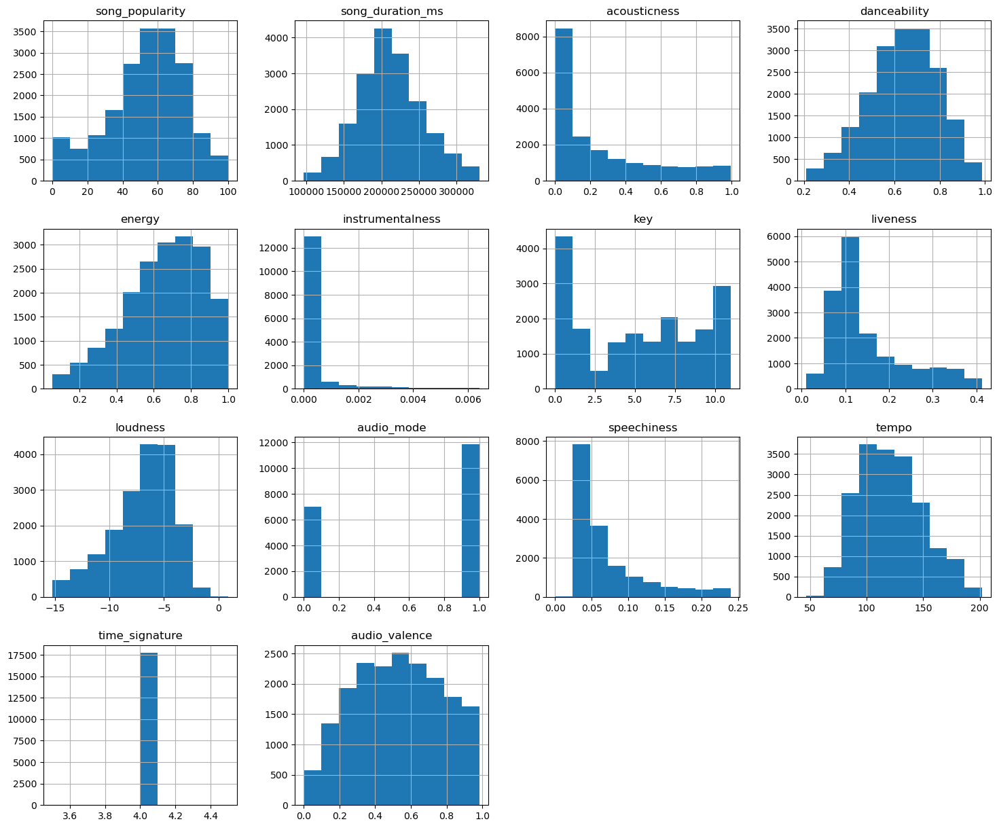

In [63]:
df[['song_popularity', 'song_duration_ms', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'key', 'liveness',
        'loudness', 'audio_mode','speechiness', 'tempo', 'time_signature',
       'audio_valence']].hist(figsize=(18,15))
ax.ticklabel_format(style='plain')

plt.show()

Las graficas nos muestra que la popularidad de la canción tiene un comportamiento similar con que la misma sea bailable (danceability) y con la intensidad del sonido(loudness.

#### Definir df numericos

In [64]:
nuevas_columnas = ['song_popularity','acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'audio_valence']
dfnum = df[nuevas_columnas]

<h3 Style="color:brown">Matriz de correlación</h3>

In [65]:
correlacion_matrix = dfnum.corr()

correlacion_matrix

,song_popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,audio_valence
song_popularity,1.000000,-0.065181,0.102564,0.003746,-0.053569,-0.022650,0.113492,0.039106,-0.020142,-0.052895
acousticness,-0.065181,1.000000,-0.164629,-0.642666,0.009024,-0.094552,-0.468114,-0.164614,-0.143904,-0.121670
danceability,0.102564,-0.164629,1.000000,-0.009150,-0.058813,-0.081635,0.065410,0.235325,-0.125661,0.312179
energy,0.003746,-0.642666,-0.009150,1.000000,-0.000845,0.162320,0.705118,0.157516,0.155851,0.298204
instrumentalness,-0.053569,0.009024,-0.058813,-0.000845,1.000000,-0.015329,-0.075398,-0.048667,0.007094,-0.036366
liveness,-0.022650,-0.094552,-0.081635,0.162320,-0.015329,1.000000,0.105493,0.052579,0.037085,0.022746
loudness,0.113492,-0.468114,0.065410,0.705118,-0.075398,0.105493,1.000000,0.154335,0.093213,0.107146
speechiness,0.039106,-0.164614,0.235325,0.157516,-0.048667,0.052579,0.154335,1.000000,0.067540,0.018319
tempo,-0.020142,-0.143904,-0.125661,0.155851,0.007094,0.037085,0.093213,0.067540,1.000000,0.035440
audio_valence,-0.052895,-0.121670,0.312179,0.298204,-0.036366,0.022746,0.107146,0.018319,0.035440,1.000000


In [66]:
correlacion_matrix[abs(correlacion_matrix>.50)]

,song_popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,audio_valence
song_popularity,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
acousticness,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
danceability,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy,NaN,NaN,NaN,1.000000,NaN,NaN,0.705118,NaN,NaN,NaN
instrumentalness,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
liveness,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
loudness,NaN,NaN,NaN,0.705118,NaN,NaN,1.000000,NaN,NaN,NaN
speechiness,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
tempo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
audio_valence,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [67]:
correlacion_matrix['song_popularity'].sort_values(ascending=False)

song_popularity     1.000000
loudness            0.113492
danceability        0.102564
speechiness         0.039106
energy              0.003746
tempo              -0.020142
liveness           -0.022650
audio_valence      -0.052895
instrumentalness   -0.053569
acousticness       -0.065181
Name: song_popularity, dtype: float64

#### Mapa de calor de correlaciones

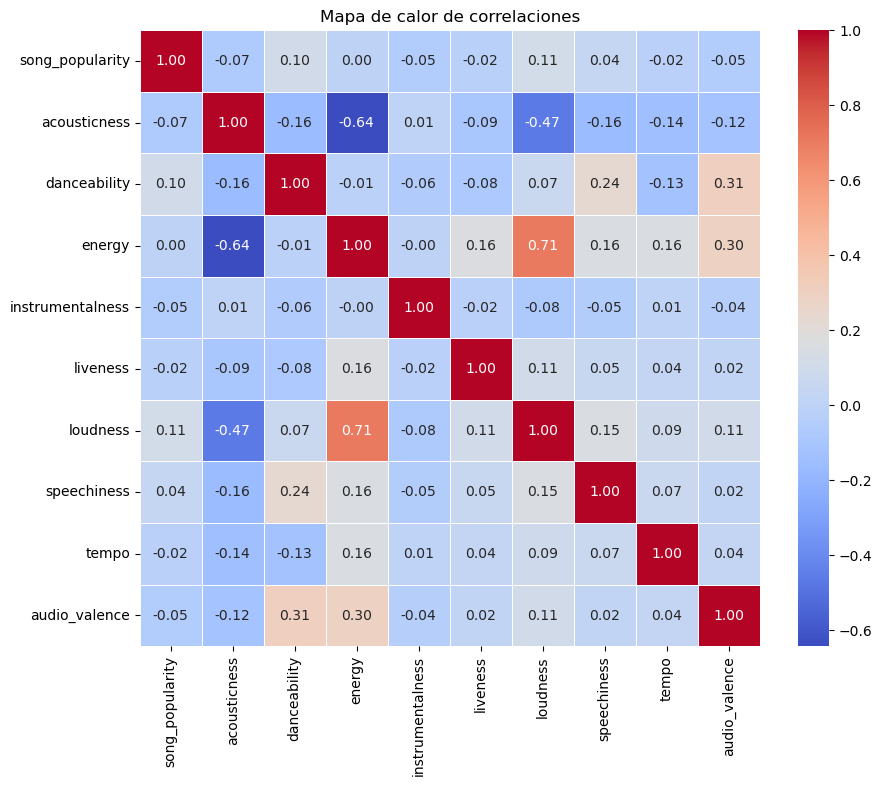

In [68]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlacion_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Mapa de calor de correlaciones')
plt.show()

El mapa de correlaciones nos muestra que la popularidad de la canción tiene una mayor relación con que la misma sea bailable (danceability) y con la intensidad del sonido(loudness), por ende entre mayores sean estos valores, mayor popularidad tendrá la canción.
Se puede ver además que hay una alta relación entre la intensidad del sonido(loudness) con las variables energía (energy) y acústica (acousticness).


<h3 Style="color:brown">Modelo Regresion Lineal Simple Popularidad de la Canción vs Bailable</h3> 

In [69]:
# Variable independiente
X = df[['danceability']]
# Variable dependiente
y = df['song_popularity']      

In [70]:
#Series
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [71]:
# Eliminar filas con valores faltantes en X_train y y_train
X_train = X_train.dropna()
y_train = y_train.dropna()

In [72]:
# Ambos conjuntos de datos tengan la misma longitud y estén correctamente alineados
X_train = X_train.dropna()
y_train = y_train[X_train.index]

In [73]:
# X_train y y_train tengan las mismas dimensiones
if len(X_train) != len(y_train):
    raise ValueError("Dimensiones de X_train y y_train no coinciden después de eliminar valores faltantes")

In [74]:
modelo = LinearRegression()

In [75]:
modelo.fit(X_train, y_train)

LinearRegression()

In [76]:
# Crea un imputador para rellenar los valores faltantes con la media de las columnas
imputador = SimpleImputer(strategy='mean')

# Ajusta el imputador a los datos de entrenamiento y transforma los datos de prueba
X_test_imputado = imputador.fit_transform(X_test)

# Ahora intenta hacer predicciones con los datos de prueba imputados
predicciones = modelo.predict(X_test_imputado)

C:\Users\juand\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [77]:
mse = mean_squared_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)
print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 478.0086938210093
R^2 Score: 0.008438506766693998


El resultados de MSE 478.01 representa valores poco ajuste del modelo a los datos observados.
El resultado R^2 Score 0.84% significa que el modelo explica menos de un porciento de la variabilidad de la variable dependiente.

#### Valores Reales vs. Las Predicciones

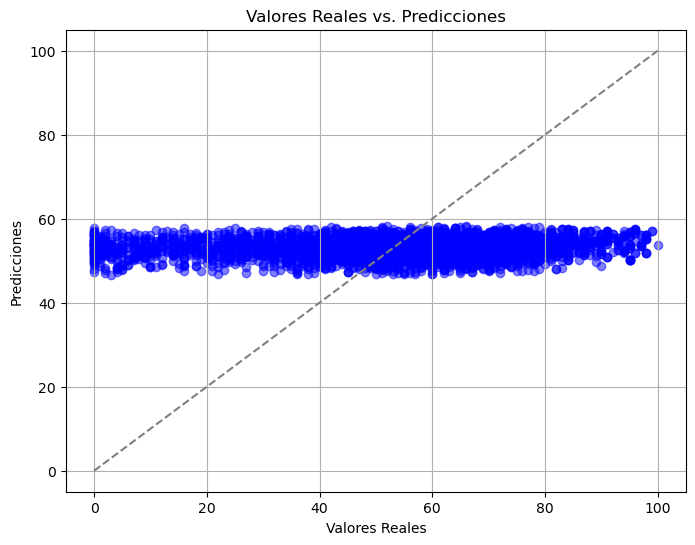

In [78]:
# Graficar los valores reales vs. las predicciones
plt.figure(figsize=(8, 6))
plt.scatter(y_test, predicciones, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='gray')  # Línea diagonal de referencia
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Valores Reales vs. Predicciones')
plt.grid(True)
plt.show()

<h3 Style="color:brown">Modelo Regresión Lineal Simple Popularidad de la Canción vs Sonoridad</h3>

In [79]:
# Variable independiente
X = df[['loudness']]  
# Variable dependiente
y = df['song_popularity']      

In [80]:
# Series
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [81]:
# Eliminar filas con valores faltantes en X_train y y_train
X_train = X_train.dropna()
y_train = y_train.dropna()

In [82]:
# Ambos conjuntos de datos tengan la misma longitud y estén correctamente alineados
X_train = X_train.dropna()
y_train = y_train[X_train.index]

In [83]:
# X_train y y_train tengan las mismas dimensiones
if len(X_train) != len(y_train):
    raise ValueError("Dimensiones de X_train y y_train no coinciden después de eliminar valores faltantes")

In [84]:
modelo = LinearRegression()

In [85]:
modelo.fit(X_train, y_train)

LinearRegression()

In [86]:
from sklearn.impute import SimpleImputer

# Crea un imputador para rellenar los valores faltantes con la media de las columnas
imputador = SimpleImputer(strategy='mean')

# Ajusta el imputador a los datos de entrenamiento y transforma los datos de prueba
X_test_imputado = imputador.fit_transform(X_test)

# Ahora intenta hacer predicciones con los datos de prueba imputados
predicciones = modelo.predict(X_test_imputado)

C:\Users\juand\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [87]:
mse = mean_squared_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)
print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 475.3103567747135
R^2 Score: 0.014035825697202076


El resultados de MSE 475.31 representa valores poco ajuste del modelo a los datos observados.
El resultado R^2 Score 1.40% significa que el modelo explica menos de dos porciento de la variabilidad de la variable dependiente.

#### Valores Reales vs. Las Predicciones

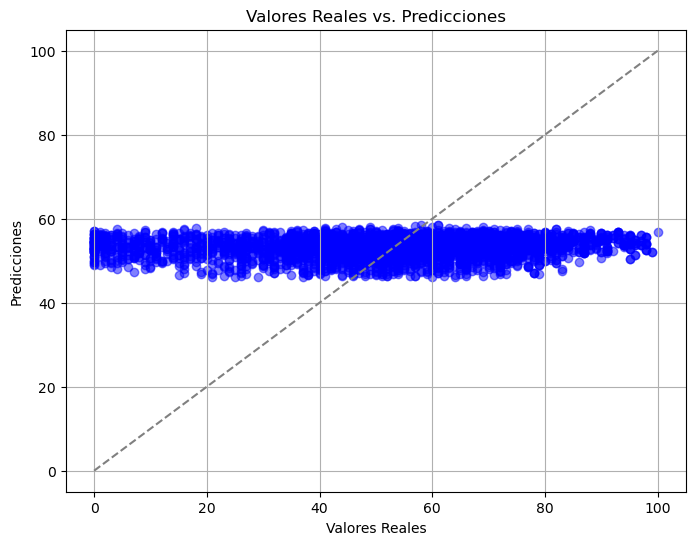

In [88]:
# Graficar los valores reales vs. las predicciones
plt.figure(figsize=(8, 6))
plt.scatter(y_test, predicciones, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='gray')  # Línea diagonal de referencia
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Valores Reales vs. Predicciones')
plt.grid(True)
plt.show()

<h3 Style="color:brown">Regresión Lineal Multiple</h3>

In [89]:
# Variables independientes
X = df[['danceability', 'loudness']]  
# Variable objetivo
y = df['song_popularity']  

In [90]:
# Series
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [91]:
modelo = LinearRegression()

In [92]:
print("Forma de X:", X.shape)
print("Forma de y:", y.shape)

Forma de X: (18835, 2)
Forma de y: (18835,)


In [93]:
# Crear un objeto SimpleImputer
imputer = SimpleImputer(strategy='mean')  # Puedes probar con 'median' o 'most_frequent' también

# Entrenar y transformar los datos de entrenamiento
X_train_imputed = imputer.fit_transform(X_train)

# Transformar los datos de prueba (sin entrenar nuevamente el imputador)
X_test_imputed = imputer.transform(X_test)

In [94]:
modelo.fit(X_train_imputed, y_train)

LinearRegression()

In [95]:
predicciones = modelo.predict(X_test_imputed)

In [96]:
# Calcular el MSE
mse = mean_squared_error(y_test, predicciones)
print("Error cuadrático medio (MSE):", mse)

# Calcular el R^2
r2 = r2_score(y_test, predicciones)
print("Coeficiente de determinación (R^2):", r2)

Error cuadrático medio (MSE): 471.6193956623482
Coeficiente de determinación (R^2): 0.021692202996091647


El resultados de MSE 471.62 representa valores poco ajuste del modelo a los datos observados. El resultado R^2 Score 2.17% significa que el modelo explica menos de tres porciento de la variabilidad de la variable dependiente.

#### Valores Reales vs. Las Predicciones

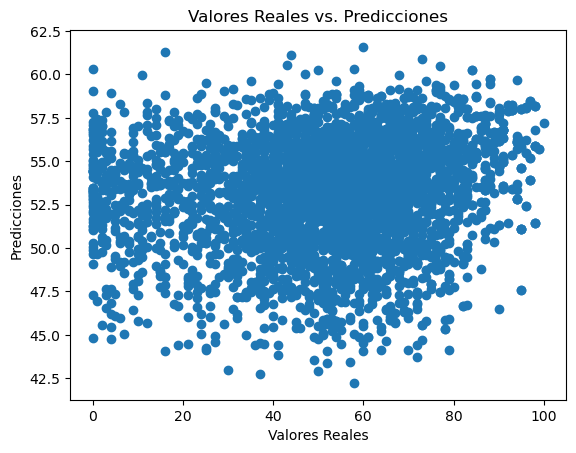

In [97]:
import matplotlib.pyplot as plt

plt.scatter(y_test, predicciones)
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Valores Reales vs. Predicciones')
plt.show()

In [98]:
# Coeficientes de las características
coeficientes = modelo.coef_
print("Coeficientes de las características:", coeficientes)

# Intercepto
intercepto = modelo.intercept_
print("Intercepto:", intercepto)

Coeficientes de las características: [14.15424802  0.8069351 ]
Intercepto: 49.678899380690375


El resultado indica que el coeficiente de 14.15 para la variable bailabe (danceability) por cada unidadel resultado esperado cambia en aproximadamente 14.15 unidades, manteniendo todas las demás características constantes. 
Por cada unidad de cambio en la variable sonoridad (loudness), el resultado esperado cambia en aproximadamente 0.81 unidades, manteniendo todas las demás características constantes.
El intercepto es el valor esperado del resultado cuando todas las características son cero. 
En este caso, el intercepto de 49.68 significa que cuando todas las características son cero, el resultado esperado es aproximadamente 49.68.

<h3 Style="color:brown">Conclusión</h3>


Mi modelo final no es muy predictivo en cuanto a la popularidad de las canciones, con un valor de R-Cuadrado muy bajo. Por lo tanto, solo un pequeño porcentaje de la variación en la popularidad de las canciones se explica mediante el modelo.

Para aumentar el poder predictivo de mi modelo, es necesario encontrar mejores interacciones entre las variables.